# RASCUNHO COM GRÁFICOS, TRATAMENTO DE DADOS, E PRÉVIA DE ANÁLISE EXPLORATÓRIA

In [51]:
import pandas as pd
import glob, os, json

# https://softhints.com/merge-multiple-json-files-pandas-dataframe/
json_dir = './jsonsteam'

json_pattern = os.path.join(json_dir, '*.json')
file_list = glob.glob(json_pattern)

dfs = []   
for file in file_list:
    with open(file) as f:
        # Caminho do arquivo
        nome_arquivo = file

        # Lendo o arquivo e convertendo
        df_json = pd.read_json(nome_arquivo)

        # Nome do arquivo
        nome_arquivo = nome_arquivo[12:] 

        # Convertendo json 
        df_json = pd.json_normalize(df_json.reviews)

        # Criando a coluna com o nome do arquivo json (tratando posteriormente daria para separar a categoria e o nome do jogo)
        df_json['nome'] = nome_arquivo
    
    # Concatenando arq
    dfs.append(df_json)

dfs
df = pd.concat(dfs)


C:\Users\GBFFO\AppData\Local\Temp\ipykernel_27020\2908929947.py:17: FutureWarning: The behavior of 'to_datetime' with 'unit' when parsing strings is deprecated. In a future version, strings will be parsed as datetime strings, matching the behavior without a 'unit'. To retain the old behavior, explicitly cast ints or floats to numeric type before calling to_datetime.
  df_json = pd.read_json(nome_arquivo)
C:\Users\GBFFO\AppData\Local\Temp\ipykernel_27020\2908929947.py:17: FutureWarning: The behavior of 'to_datetime' with 'unit' when parsing strings is deprecated. In a future version, strings will be parsed as datetime strings, matching the behavior without a 'unit'. To retain the old behavior, explicitly cast ints or floats to numeric type before calling to_datetime.
  df_json = pd.read_json(nome_arquivo)
C:\Users\GBFFO\AppData\Local\Temp\ipykernel_27020\2908929947.py:17: FutureWarning: The behavior of 'to_datetime' with 'unit' when parsing strings is deprecated. In a future version, st

In [52]:
# Exibindo dados no pandas que foram convertidos e concatenados dos diversos jsons que estavam na pasta ./jsonsteam
df

,recommendationid,language,review,timestamp_created,timestamp_updated,voted_up,votes_up,votes_funny,weighted_vote_score,comment_count,...,author.steamid,author.num_games_owned,author.num_reviews,author.playtime_forever,author.playtime_last_two_weeks,author.playtime_at_review,author.last_played,nome,timestamp_dev_responded,developer_response
0,110075401,brazilian,"É um jogo de comando simples, uma história int...",1.644686e+09,1.644686e+09,True,0.0,0.0,0,0.0,...,76561198225403644,76.0,2.0,1089.0,0.0,826.0,1.645021e+09,Action_12isBetterThan6.json,NaN,NaN
1,107754808,brazilian,"Um ótimo jogo, para quem curte voltar nos temp...",1.641850e+09,1.641850e+09,True,0.0,0.0,0,0.0,...,76561198888216389,137.0,7.0,76.0,0.0,76.0,1.641850e+09,Action_12isBetterThan6.json,NaN,NaN
2,107325671,brazilian,hotline miami de velho oeste,1.641327e+09,1.641327e+09,True,0.0,0.0,0,0.0,...,76561199217171933,15.0,14.0,575.0,0.0,482.0,1.644588e+09,Action_12isBetterThan6.json,NaN,NaN
3,105835857,brazilian,não é nada comparado ao hotline miami\na jogab...,1.639515e+09,1.639581e+09,False,0.0,0.0,0,0.0,...,76561198067129723,1067.0,755.0,199.0,0.0,33.0,1.639526e+09,Action_12isBetterThan6.json,NaN,NaN
4,105756243,brazilian,"Okay, where do I even begin with this one...\n...",1.639390e+09,1.639390e+09,False,0.0,0.0,0,0.0,...,76561198329308097,593.0,2.0,447.0,0.0,447.0,1.639385e+09,Action_12isBetterThan6.json,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Strategy_ZomboBusterAdvance.json,NaN,NaN
12,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Strategy_ZomboBusterAdvance.json,NaN,NaN
13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Strategy_ZomboBusterAdvance.json,NaN,NaN
14,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Strategy_ZomboBusterAdvance.json,NaN,NaN


In [54]:
df.describe()

,timestamp_created,timestamp_updated,votes_up,votes_funny,comment_count,author.num_games_owned,author.num_reviews,author.playtime_forever,author.playtime_last_two_weeks,author.playtime_at_review,author.last_played,timestamp_dev_responded
count,2.721740e+06,2.721740e+06,2.721740e+06,2.721740e+06,2.721740e+06,2.721740e+06,2.721740e+06,2.721740e+06,2.721740e+06,2.692134e+06,2.721740e+06,2.798000e+03
mean,1.566260e+09,1.568954e+09,1.310505e+00,6.785535e+04,9.476548e-02,1.384862e+02,1.806774e+01,9.804648e+03,7.499598e+01,4.734457e+03,1.583273e+09,1.594620e+09
std,6.756748e+07,6.665593e+07,1.009875e+01,1.707133e+07,9.453668e-01,3.290500e+02,6.425848e+01,3.151589e+04,5.404053e+02,1.681851e+04,1.672101e+08,3.958387e+07
min,1.287182e+09,1.287182e+09,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,0.000000e+00,1.418760e+09
25%,1.519581e+09,1.527191e+09,0.000000e+00,0.000000e+00,0.000000e+00,2.400000e+01,2.000000e+00,4.850000e+02,0.000000e+00,2.630000e+02,1.577741e+09,1.566785e+09
50%,1.586400e+09,1.588858e+09,0.000000e+00,0.000000e+00,0.000000e+00,5.900000e+01,6.000000e+00,1.724000e+03,0.000000e+00,8.060000e+02,1.622502e+09,1.601528e+09
75%,1.619653e+09,1.621479e+09,1.000000e+00,0.000000e+00,0.000000e+00,1.400000e+02,1.400000e+01,6.441000e+03,0.000000e+00,2.782000e+03,1.641766e+09,1.626284e+09
max,1.648525e+09,1.648526e+09,3.434000e+03,4.294967e+09,2.750000e+02,1.593700e+04,2.665000e+03,2.704136e+06,2.015400e+04,2.425045e+06,1.648534e+09,1.648343e+09


In [55]:
#df.to_csv("steam_reviews_completo2.csv")

### LENDO DO ARQUIVO CSV
- Precisei tratar o nome de alguns arquivos que não seguiam o formato CATEGORIA_NOMEDOJOGO, bem como excluir outros que estavam duplicados, ou que não tinham nome de jogo algum, ou que o nome da categoria estava errada (por exemplo, Racings quando deveria ser Racing). Coloquei todos em uma mesma parta chamada ./steambr, rodei o dataframe, depois transformei em csv para facilitar futuras leituras do dataset.

In [126]:
df = pd.read_csv('steam_reviews_completo2.csv')

C:\Users\GBFFO\AppData\Local\Temp\ipykernel_27020\2442276669.py:1: DtypeWarning: Columns (6,11,12,13,23) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('steam_reviews_completo2.csv')


In [7]:
#df_csv[0]

In [8]:
#df_csv['nome'].value_counts()[:30]

In [127]:
df['nome'].value_counts()[:25]

nome
Action_GrandTheftAutoV.json                76761
FPS_TomClancysRainbowSixSiege.json         46811
Simulation_EuroTruckSimulator22012.json    45687
Action_PUBGBATTLEGROUNDS.json              45090
RPG_StardewValley.json                     39723
Indie_Brawhalla.json                       38375
Horror_DeadbyDaylight.json                 34964
Racing_RocketLeague.json                   34087
RPG_TheWitcher3WildHunt.json               33139
Adventure_Terraria.json                    28432
Adventure_Unturned.json                    25782
Indie_AmongUs.json                         25645
Action_PAYDAY2.json                        22810
RPG_Warframe.json                          20838
Adventure_ARKSurvivalEvolved.json          20570
Adventure_Rust.json                        18514
Indie_HollowKnight.json                    17434
Adventure_TombRaider2013.json              16494
Horror_Phasmophobia.json                   15001
RPG_Destiny2.json                          14870
RPG_DyingLight.

In [128]:
df['language'].value_counts()[:25]

language
brazilian     2719375
english          1528
russian           317
spanish           110
schinese           91
polish             54
turkish            53
french             53
german             29
czech              22
koreana            21
latam              20
japanese           11
tchinese           11
italian             7
dutch               7
swedish             5
finnish             5
portuguese          4
ukrainian           3
vietnamese          3
danish              3
romanian            3
norwegian           3
hungarian           1
Name: count, dtype: int64

In [129]:
null_count = df.isnull().sum()

null_count

Unnamed: 0                              0
recommendationid                    84127
language                            84127
review                              86844
timestamp_created                   84127
timestamp_updated                   84127
voted_up                            84127
votes_up                            84127
votes_funny                         84127
weighted_vote_score                 84127
comment_count                       84127
steam_purchase                      84127
received_for_free                   84127
written_during_early_access         84127
author.steamid                      84127
author.num_games_owned              84127
author.num_reviews                  84127
author.playtime_forever             84127
author.playtime_last_two_weeks      84127
author.playtime_at_review          113733
author.last_played                  84127
nome                                    0
timestamp_dev_responded           2803069
developer_response                

In [130]:
nan_count = df['review'].isna().sum()

nan_count

86844

In [131]:
df.columns

Index(['Unnamed: 0', 'recommendationid', 'language', 'review',
       'timestamp_created', 'timestamp_updated', 'voted_up', 'votes_up',
       'votes_funny', 'weighted_vote_score', 'comment_count', 'steam_purchase',
       'received_for_free', 'written_during_early_access', 'author.steamid',
       'author.num_games_owned', 'author.num_reviews',
       'author.playtime_forever', 'author.playtime_last_two_weeks',
       'author.playtime_at_review', 'author.last_played', 'nome',
       'timestamp_dev_responded', 'developer_response'],
      dtype='object')

https://partner.steamgames.com/doc/store/getreviews

- success — 1 se a consulta foi bem-sucedida
- query_summary — retornado na primeira requisição
- num_reviews — a quantidade de análises retornadas na resposta
- review_score — a avaliação da análise
- review_score_desc — a descrição da avaliação da análise
- total_positive — o total de análises positivas
- total_negative — o total de análises negativas
- total_review — o total de análises que correspondem aos parâmetros da consulta
- cursor — o valor que deve ser passado no parâmetro cursor da próxima requisição para recuperar o próximo lote de análises


### Reviews
- recommendationid — o ID único da recomendação
#### Author
- steamid — o ID Steam do usuário
- num_games_owned — a quantidade de jogos na conta do usuário
- num_reviews — a quantidade de análises escritas pelo usuário
- playtime_forever — o tempo de uso total do aplicativo pelo usuário
- playtime_last_two_weeks — tempo de uso do aplicativo pelo usuário nas últimas duas semanas
- playtime_at_review — tempo de uso quando a análise foi escrita
- last_played — horário da última vez em que o usuário jogou
- language — o idioma da análise, indicado pelo usuário
- review — o texto da análise escrita
- timestamp_created — a data e hora da criação da análise (formato Era Unix)
- timestamp_updated — a data e hora da última atualização da análise (formato Era Unix)
- voted_up — true significa uma recomendação positiva
- votes_up — a quantidade de usuários que acharam a análise útil
- votes_funny — a quantidade de usuários que acharam a análise engraçada
- weighted_vote_score — pontuação de utilidade
- comment_count — a quantidade de comentários na análise
- steam_purchase — true se o usuário comprou o jogo no Steam
- received_for_free — true se o usuário assinalou a caixa que indica que receberam o produto de graça
- written_during_early_access — true se o usuário publicou a análise enquanto este estava em acesso antecipado


In [132]:
# Exibindo as dimensões do nosso dataset
df.shape

(2805867, 24)

In [133]:
# Exibindo as colunas e o tipo de dado de cada coluna
df.dtypes

Unnamed: 0                          int64
recommendationid                  float64
language                           object
review                             object
timestamp_created                 float64
timestamp_updated                 float64
voted_up                           object
votes_up                          float64
votes_funny                       float64
weighted_vote_score               float64
comment_count                     float64
steam_purchase                     object
received_for_free                  object
written_during_early_access        object
author.steamid                    float64
author.num_games_owned            float64
author.num_reviews                float64
author.playtime_forever           float64
author.playtime_last_two_weeks    float64
author.playtime_at_review         float64
author.last_played                float64
nome                               object
timestamp_dev_responded           float64
developer_response                

In [134]:
string = "categorianome"

vet = string.split('_', 1)


cat = ''
nm = ''
if len(vet) > 1:
    cat = string.split('_', 1)[0]
    nm = string.split('_', 1)[1]
else:
    cat = string.split('_', 1)[0]

print(cat)
print(nm)


categorianome



In [135]:

df_teste = df.drop_duplicates().copy()

In [123]:
# Importando a biblioteca NumPy: biblioteca para a linguagem de programação Python, que suporta o processamento de grandes, multi-dimensionais arranjos e matrizes, juntamente com uma grande coleção de funções matemáticas de alto nível para operar sobre estas matrizes.)
import numpy as np 

# Importando a biblioteca matplotlib que serve para visualização de dados
import matplotlib.pylab as plt 

# Importando a biblioteca seaborn que é útil para geração de gráficos para análise exploratória de dados
import seaborn as sns 

plt.style.use('ggplot') # Configurando o "estilo" dos gráficos do Matplotlib

In [136]:
# Criando uma nova coluna com a categoria do jogo
df_teste["Category"] = (np.where(df['nome'].str.contains('_'),
                  df['nome'].str.split('_').str[0],
                  df['nome']))

In [137]:
# Criando uma nova coluna com o nome do jogo
df_teste["NameGame"] = (np.where(df['nome'].str.contains('_'),
                  df['nome'].str.split('_').str[1],
                  df['nome']))

df_teste["NameGame"] = df_teste["NameGame"].str.replace(".json","")

In [138]:
df_teste

,Unnamed: 0,recommendationid,language,review,timestamp_created,timestamp_updated,voted_up,votes_up,votes_funny,weighted_vote_score,...,author.num_reviews,author.playtime_forever,author.playtime_last_two_weeks,author.playtime_at_review,author.last_played,nome,timestamp_dev_responded,developer_response,Category,NameGame
0,0,110075401.0,brazilian,"É um jogo de comando simples, uma história int...",1.644686e+09,1.644686e+09,True,0.0,0.0,0.0,...,2.0,1089.0,0.0,826.0,1.645021e+09,Action_12isBetterThan6.json,NaN,NaN,Action,12isBetterThan6
1,1,107754808.0,brazilian,"Um ótimo jogo, para quem curte voltar nos temp...",1.641850e+09,1.641850e+09,True,0.0,0.0,0.0,...,7.0,76.0,0.0,76.0,1.641850e+09,Action_12isBetterThan6.json,NaN,NaN,Action,12isBetterThan6
2,2,107325671.0,brazilian,hotline miami de velho oeste,1.641327e+09,1.641327e+09,True,0.0,0.0,0.0,...,14.0,575.0,0.0,482.0,1.644588e+09,Action_12isBetterThan6.json,NaN,NaN,Action,12isBetterThan6
3,3,105835857.0,brazilian,não é nada comparado ao hotline miami\na jogab...,1.639515e+09,1.639581e+09,False,0.0,0.0,0.0,...,755.0,199.0,0.0,33.0,1.639526e+09,Action_12isBetterThan6.json,NaN,NaN,Action,12isBetterThan6
4,4,105756243.0,brazilian,"Okay, where do I even begin with this one...\n...",1.639390e+09,1.639390e+09,False,0.0,0.0,0.0,...,2.0,447.0,0.0,447.0,1.639385e+09,Action_12isBetterThan6.json,NaN,NaN,Action,12isBetterThan6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2805862,11,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,Strategy_ZomboBusterAdvance.json,NaN,NaN,Strategy,ZomboBusterAdvance
2805863,12,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,Strategy_ZomboBusterAdvance.json,NaN,NaN,Strategy,ZomboBusterAdvance
2805864,13,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,Strategy_ZomboBusterAdvance.json,NaN,NaN,Strategy,ZomboBusterAdvance
2805865,14,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,Strategy_ZomboBusterAdvance.json,NaN,NaN,Strategy,ZomboBusterAdvance


In [139]:
df_teste['NameGame'].value_counts()[0:25]

NameGame
GrandTheftAutoV              76761
TomClancysRainbowSixSiege    46811
EuroTruckSimulator22012      45687
PUBGBATTLEGROUNDS            45090
StardewValley                39723
Brawhalla                    38375
DeadbyDaylight               34981
RocketLeague                 34087
TheWitcher3WildHunt          33139
Terraria                     28432
Unturned                     26247
AmongUs                      25645
PAYDAY2                      22810
Warframe                     20838
ARKSurvivalEvolved           20570
Rust                         18514
HollowKnight                 17434
TombRaider2013               16494
Phasmophobia                 15001
Destiny2                     14870
DyingLight                   14175
NewWorld(1)                  12746
FallGuys                     12504
TheForest                    12401
LifeisStrangeEpisode1        12241
Name: count, dtype: int64

In [140]:
df_teste['Category'].value_counts()[0:25]

Category
Action        696989
Indie         528157
RPG           479757
Adventure     379658
Strategy      188462
Simulation    157409
Horror        151706
FPS           102868
Racing         96221
Sports         24500
SImulation       127
Racings           13
Name: count, dtype: int64

In [141]:
df_teste['votes_up'].value_counts()[:30]

votes_up
0.0     2007391
1.0      359308
2.0      125669
3.0       59170
4.0       34955
5.0       23322
6.0       16260
7.0       12229
8.0        9641
9.0        7763
10.0       6189
11.0       5193
12.0       4493
13.0       3776
14.0       3221
15.0       2965
16.0       2613
17.0       2249
18.0       2104
19.0       1868
20.0       1657
21.0       1583
22.0       1387
23.0       1276
24.0       1239
25.0       1099
26.0       1052
28.0        900
27.0        899
29.0        878
30.0        782
Name: count, dtype: int64

In [152]:
df_teste['votes_funny'].value_counts()

votes_funny
0.0      2448924
1.0       172465
2.0        38773
3.0        16226
4.0         9195
          ...   
335.0          1
691.0          1
719.0          1
774.0          1
230.0          1
Name: count, Length: 357, dtype: int64

In [142]:
# Criando uma nova coluna com a quantidade de caracteres digitados no review
df_teste["character_review"] = df_teste['review'].str.len()

# Exibindo novamente o quadro geral com informações estatísticas das novas colunas criadas
df_teste.describe()


,Unnamed: 0,recommendationid,timestamp_created,timestamp_updated,votes_up,votes_funny,weighted_vote_score,comment_count,author.steamid,author.num_games_owned,author.num_reviews,author.playtime_forever,author.playtime_last_two_weeks,author.playtime_at_review,author.last_played,timestamp_dev_responded,character_review
count,2.805867e+06,2.721740e+06,2.721740e+06,2.721740e+06,2.721740e+06,2.721740e+06,2.721740e+06,2.721740e+06,2.721740e+06,2.721740e+06,2.721740e+06,2.721740e+06,2.721740e+06,2.692134e+06,2.721740e+06,2.798000e+03,2.719023e+06
mean,5.339996e+03,6.495313e+07,1.566260e+09,1.568954e+09,1.310505e+00,6.785535e+04,1.530434e-01,9.476548e-02,7.656120e+16,1.384862e+02,1.806774e+01,9.804648e+03,7.499598e+01,4.734457e+03,1.583273e+09,1.594620e+09,1.837080e+02
std,1.028993e+04,2.965021e+07,6.756748e+07,6.665593e+07,1.009875e+01,1.707133e+07,2.436125e-01,9.453668e-01,3.578892e+08,3.290500e+02,6.425848e+01,3.151589e+04,5.404053e+02,1.681851e+04,1.672101e+08,3.958387e+07,4.660715e+02
min,0.000000e+00,1.091800e+04,1.287182e+09,1.287182e+09,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,7.656120e+16,0.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00,1.000000e+00,0.000000e+00,1.418760e+09,1.000000e+00
25%,2.000000e+02,4.039526e+07,1.519581e+09,1.527191e+09,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,7.656120e+16,2.400000e+01,2.000000e+00,4.850000e+02,0.000000e+00,2.630000e+02,1.577741e+09,1.566785e+09,1.400000e+01
50%,1.129000e+03,6.692941e+07,1.586400e+09,1.588858e+09,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,7.656120e+16,5.900000e+01,6.000000e+00,1.724000e+03,0.000000e+00,8.060000e+02,1.622502e+09,1.601528e+09,5.000000e+01
75%,4.690000e+03,9.107948e+07,1.619653e+09,1.621479e+09,1.000000e+00,0.000000e+00,4.761905e-01,0.000000e+00,7.656120e+16,1.400000e+02,1.400000e+01,6.441000e+03,0.000000e+00,2.782000e+03,1.641766e+09,1.626284e+09,1.540000e+02
max,7.676000e+04,1.130016e+08,1.648525e+09,1.648526e+09,3.434000e+03,4.294967e+09,9.867084e-01,2.750000e+02,7.656120e+16,1.593700e+04,2.665000e+03,2.704136e+06,2.015400e+04,2.425045e+06,1.648534e+09,1.648343e+09,8.000000e+03


### Teremos que excluir os review que não são PT-BR e os que tem review nulos (além de algum outro critério que acharmos interessante)

In [161]:
# Conferindo comentários que não foram escritos em PT-BR
df_foreign = df_teste[df_teste.language != "brazilian" ]

df_foreign = df_foreign[df['language'].notnull()]

df_foreign['review']

C:\Users\GBFFO\AppData\Local\Temp\ipykernel_27020\86897461.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  df_foreign = df_foreign[df['language'].notnull()]


1116626                                               хорошо
1116627    One of the most compelling emotional games I'v...
1116628                            уже как год немогу пройти
1116629                                              classic
1116630    why are unused gift copies of half life 2 not ...
                                 ...                        
2759817    .10 cents a megabyte, Can't get a better deal ...
2759818    Awesome game, a rare gem in todays world of mi...
2759819    IfWeDue,WeFinishedAllOfThisGame\n如果我們開黑店，這款遊戲索...
2759820    If you like the idea of a psychological battle...
2759821    SpyParty is one of the best multiplayer games ...
Name: review, Length: 2365, dtype: object

## Gerando Gráficos para Analisar o Dataset

### Quantidade de reviews por categoria

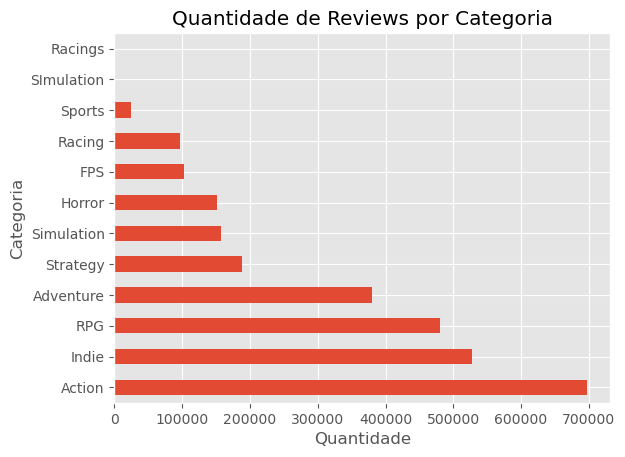

In [143]:
# Quantidade de reviews por região
ax_review_category = df_teste['Category'].value_counts().plot(kind='barh', title='Quantidade de Reviews por Categoria', xlabel='Quantidade',ylabel='Categoria')

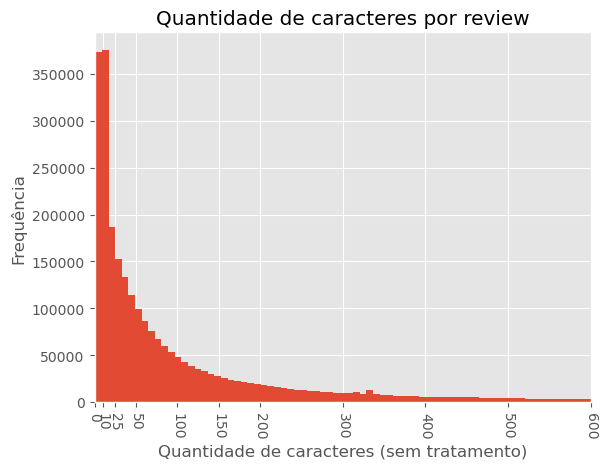

In [144]:
# Estimativa de densidade dos dados (KDE): Quantidade de caracteres por review
#df['number_caracteres'].plot(kind='kde', title='Quantidade de caracteres por review', grid=True, xlim=(0,1000),xticks=(0,50,100,200,300,400,500,600,700,800,900,1000),xlabel='Quantidade de caracteres',ylabel='Densidade')

# Histograma: Quantidade de caracteres por review
ax_character_review = df_teste['character_review'].plot(kind='hist', title='Quantidade de caracteres por review', grid=True, xlim=(0,600),xticks=(0,10,25,50,100,150,200,300,400,500,600,700,800,900,1000),xlabel='Quantidade de caracteres (sem tratamento)',ylabel='Frequência',bins =1000)
ax_character_review.set_xticklabels(ax_character_review.get_xticks(), rotation = -90)
ax_character_review
plt.show()
# https://medium.com/@gisely.alves/visualiza%C3%A7%C3%A3o-de-dados-com-seaborn-2fd0defd9adb

#### CRIAR GRÁFICO DE QUANTIDADE DE VOTES_UP AGRUPADOS: EX - 0 / 1-5 / 5-10 / 10-50 / 50-100 / 100-1000 / 1000+?

In [162]:
# Quantidade de reviews vs votes_up
#ax_review_category = df_teste['votes_up'].value_counts().plot(kind='barh', title='Quantidade de Reviews por votes_up', xlabel='Quantidade',ylabel='Categoria')

# CRIAR GRÁFICO DE QUANTIDADE DE VOTES_UP AGRUPADOS: EX - 0 / 1-5 / 5-10 / 10-50 / 50-100 / 100-1000 / 1000+

### Usando a funcionalidade da biblioteca Seaborn para comparar/correlacionar diversas características do nosso conjunto de dados (objetivo: identificar outros padrões entre os dados)

In [145]:
df_teste.dtypes

Unnamed: 0                          int64
recommendationid                  float64
language                           object
review                             object
timestamp_created                 float64
timestamp_updated                 float64
voted_up                           object
votes_up                          float64
votes_funny                       float64
weighted_vote_score               float64
comment_count                     float64
steam_purchase                     object
received_for_free                  object
written_during_early_access        object
author.steamid                    float64
author.num_games_owned            float64
author.num_reviews                float64
author.playtime_forever           float64
author.playtime_last_two_weeks    float64
author.playtime_at_review         float64
author.last_played                float64
nome                               object
timestamp_dev_responded           float64
developer_response                

In [146]:
df_teste['written_during_early_access'].value_counts()[:30]

written_during_early_access
False    2469264
True      252476
Name: count, dtype: int64

In [148]:
#df_teste['weighted_vote_score'].value_counts()[:25]

d:\Anaconda\envs\AmbientePLN\lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


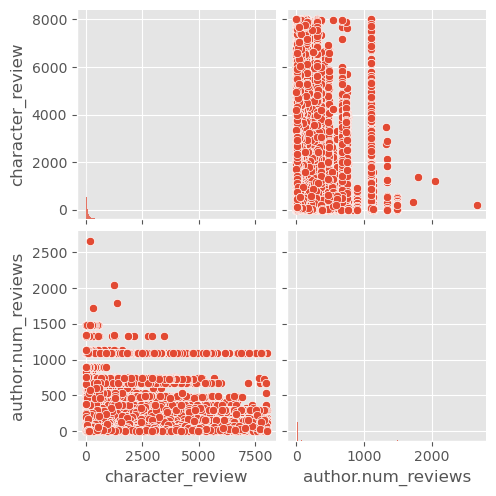

In [149]:
# Analisando alguns dados por nota
sns.pairplot(df_teste, vars=['character_review','author.num_reviews'])
plt.show()

d:\Anaconda\envs\AmbientePLN\lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


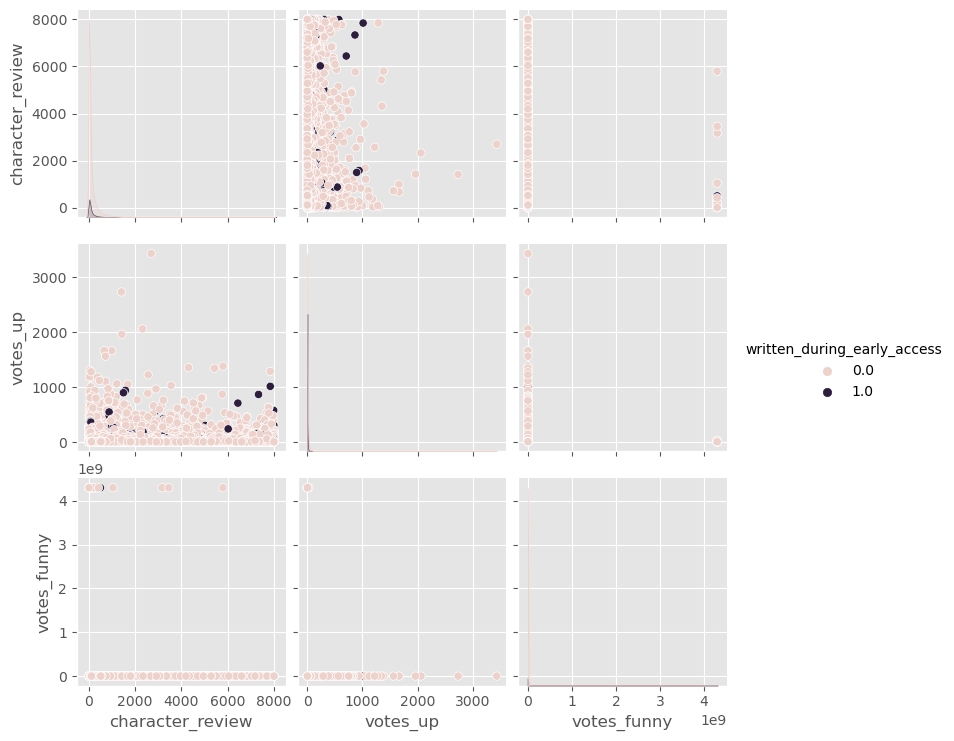

In [150]:
# Analisando alguns dados por gênero
sns.pairplot(df_teste, vars=['character_review','votes_up','votes_funny'], hue='written_during_early_access')
plt.show()

# sns.pairplot(df_teste, vars=['character_review','weighted_vote_score'], hue='written_during_early_access')
# plt.show()

# Analisando alguns dados por categoria do produto
# sns.pairplot(df_teste, vars=['age_when_review','number_caracteres','overall_rating'], hue='site_category_lv1')
# plt.show()